# Tutorial 4: Xenium IPF Lung

In this demo, we applied NovAST to samples from a healthy donor (VUHD116) and a patient with idiopathic pulmonary fibrosis (IPF; VUILD107), as described in the associated [paper](https://www.nature.com/articles/s41588-025-02080-x) and based on the corresponding [original dataset](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE250346). We converted the data into AnnData (`.h5ad`) format and stored it in the `demo_data/Xenium_IPF_lung_exploration` directory in this [GitHub repository](https://github.com/YMa-lab/NovAST/). 

## 1. Import NovAST Functions
After installing the package, import the required functions from NovAST for subsequent use.

In [2]:
from NovAST import run_NovAST, NovAST_plot, NovAST_evaluation

## 2. Data Preparation
NovAST requires both **reference** and **target** datasets in **AnnData (.h5ad)** format. Specify the dataset paths below for subsequent loading.

In [3]:
train_path="VUHD116_Control.h5ad"
test_path="VUILD107_Disease.h5ad"

Next, we set NovAST to **exploration mode** assuming the target dataset does **not** contain ground-truth labels.

In [4]:
training_mode = "exploration"

## 3. Required Arguments
The following parameters **must** be specified when running NovAST:

In [6]:
# Column name in the reference AnnData that stores cell-type annotations
celltype_name_train = "final_lineage"

# Name of the output directory where results will be saved
name = "demo_exploration"

# A user-defined dataset identifier used for organizing output files
dataset = "Xenium_IPF_lung"
 
# Saving directory
savedir = "./"

All remaining hyperparameters are defined in the file **`default_config.yaml`**.  
Users may override any of them directly when calling `run_NovAST()` if customization is needed.

## 3. Run NovAST
You can now run NovAST using the specified settings as follows:

In [3]:
args = run_NovAST(
    training_mode=training_mode,
    train_path=train_path,
    test_path=test_path,
    celltype_name_train=celltype_name_train,
    name=name,
    dataset=dataset,
    spot_size=3
)

Random seed set as 42
The saving directory set to ./demo_exploration
The training mode set to exploration!
Number of overlapped genes: 343
Datasets have been preprocessed!
──────────────────────────────────────────
Starting training for seed 1...
Random seed set as 2
Part I training started! Round 1
[Epoch 0] Total: 4.658848 | Recon: 2.256708 | Sim: 1.143524 | MMF: 8.012069
[Epoch 1] Total: 3.939712 | Recon: 2.112867 | Sim: 0.899255 | MMF: 5.678873
[Epoch 2] Total: 3.655670 | Recon: 2.019261 | Sim: 0.857403 | MMF: 4.360435
[Epoch 3] Total: 3.504785 | Recon: 1.954035 | Sim: 0.843095 | MMF: 3.704172
[Epoch 4] Total: 3.388434 | Recon: 1.917055 | Sim: 0.831822 | MMF: 3.068276
[Epoch 5] Total: 3.323218 | Recon: 1.895005 | Sim: 0.827230 | MMF: 2.700907
[Epoch 6] Total: 3.272742 | Recon: 1.883531 | Sim: 0.821711 | MMF: 2.388162
[Epoch 7] Total: 3.237300 | Recon: 1.876335 | Sim: 0.817798 | MMF: 2.160481
[Epoch 8] Total: 3.200421 | Recon: 1.860175 | Sim: 0.815283 | MMF: 1.988505
[Epoch 9] Total

/oscar/home/yzhu194/stellar_py/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-12-17 14:14:41.226454: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-12-17 14:14:43.639573: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Labelspreading takes 41.34264636039734 seconds
Part II training done
--- 380.0986273288727 seconds ---
──────────────────────────────────────────
Starting training for seed 2...
Random seed set as 3
Part I training started! Round 2
[Epoch 0] Total: 4.963465 | Recon: 2.241164 | Sim: 1.320288 | MMF: 8.738979
[Epoch 1] Total: 4.167545 | Recon: 2.109849 | Sim: 1.034220 | MMF: 6.097877
[Epoch 2] Total: 3.722378 | Recon: 2.011420 | Sim: 0.882494 | MMF: 4.754655
[Epoch 3] Total: 3.521921 | Recon: 1.948104 | Sim: 0.853161 | MMF: 3.793912
[Epoch 4] Total: 3.410017 | Recon: 1.917210 | Sim: 0.840667 | MMF: 3.158731
[Epoch 5] Total: 3.334249 | Recon: 1.900930 | Sim: 0.831633 | MMF: 2.690329
[Epoch 6] Total: 3.286265 | Recon: 1.883307 | Sim: 0.826331 | MMF: 2.460946
[Epoch 7] Total: 3.244515 | Recon: 1.873038 | Sim: 0.820904 | MMF: 2.222115
[Epoch 8] Total: 3.214884 | Recon: 1.861718 | Sim: 0.818422 | MMF: 2.073751
[Epoch 9] Total: 3.172479 | Recon: 1.847711 | Sim: 0.814145 | MMF: 1.849656
[Epoch 1

For each training round, the pipeline saves all outputs to the specified directory, with each random seed assigned its own subfolder. This includes the trained model, the Stage-1 loss values, and a final result file named **`adata_unlabeled_final.h5ad`**, which stores the latent embeddings in **`.obsm['X_latent']`** and the final predicted labels in **`.obs['voted_final_prediction']`**.

## 4. Visualize the output
Running the following line of code will generate UMAP visualizations as well as spatial plots of the predicted cell types and their associated confidence scores, and save them to each individual seed’s output directory.

Exploration mode detected. Generating plots for 10 seeds...

──────────────────────────────────────────
Starting plotting for seed 1...
Random seed set as 2
Generating UMAP plot...


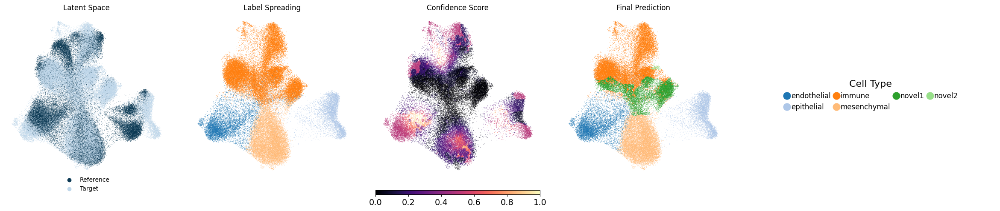

UMAP plot saved.
Generating spatial plot...


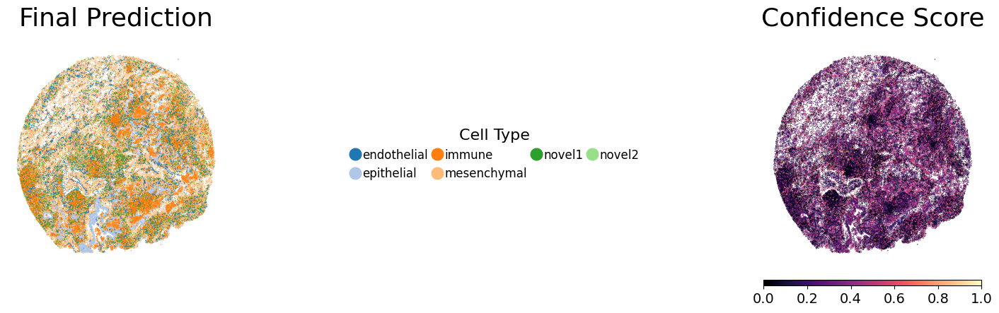

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 2...
Random seed set as 3
Generating UMAP plot...


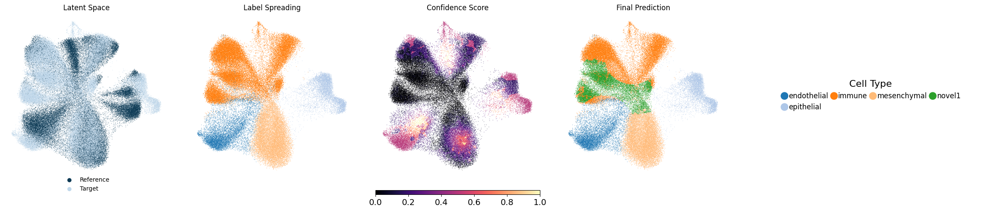

UMAP plot saved.
Generating spatial plot...


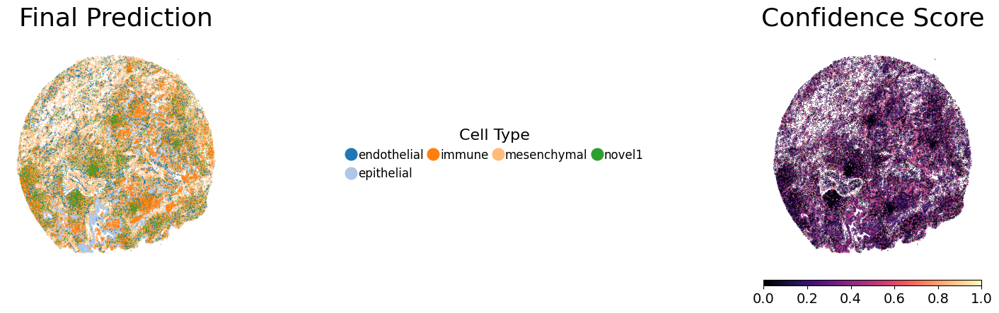

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 3...
Random seed set as 4
Generating UMAP plot...


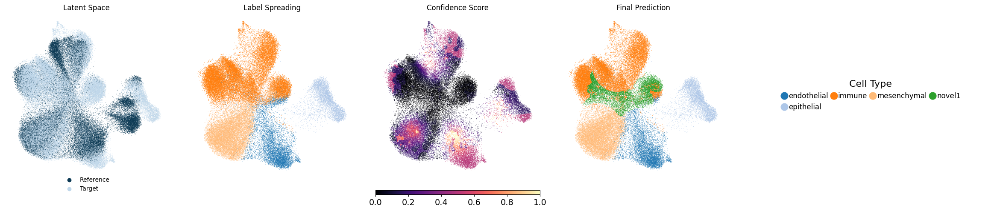

UMAP plot saved.
Generating spatial plot...


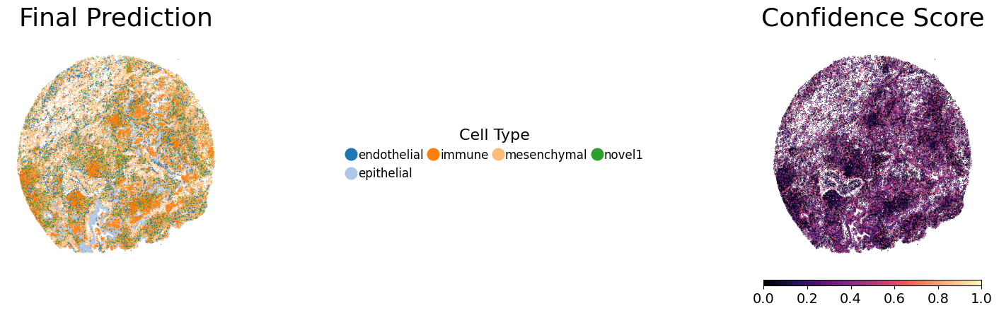

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 4...
Random seed set as 5
Generating UMAP plot...


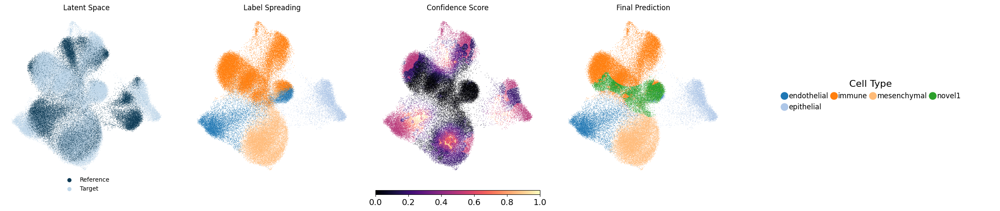

UMAP plot saved.
Generating spatial plot...


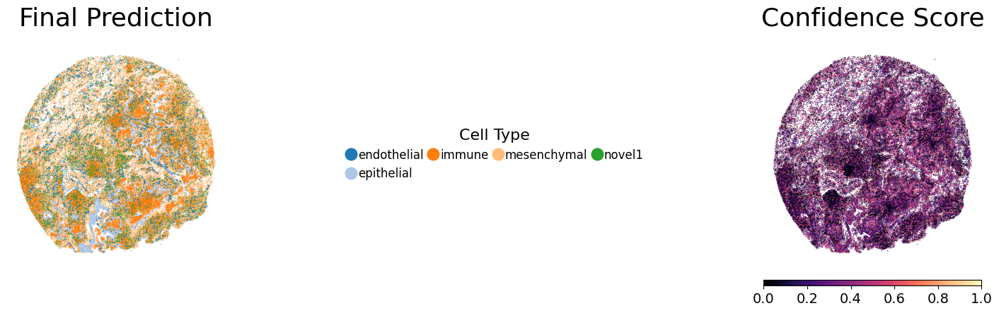

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 5...
Random seed set as 6
Generating UMAP plot...


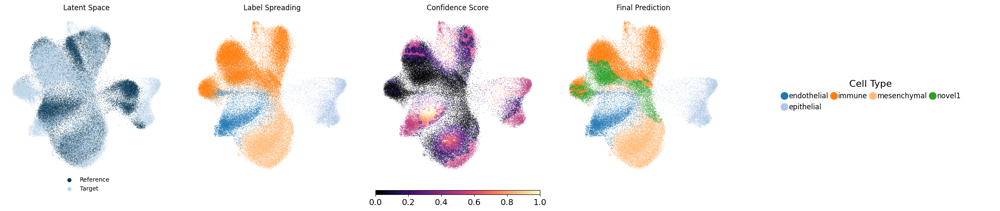

UMAP plot saved.
Generating spatial plot...


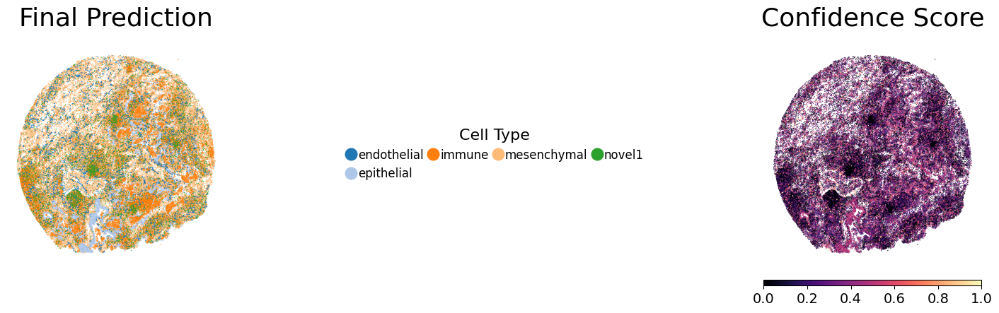

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 6...
Random seed set as 7
Generating UMAP plot...


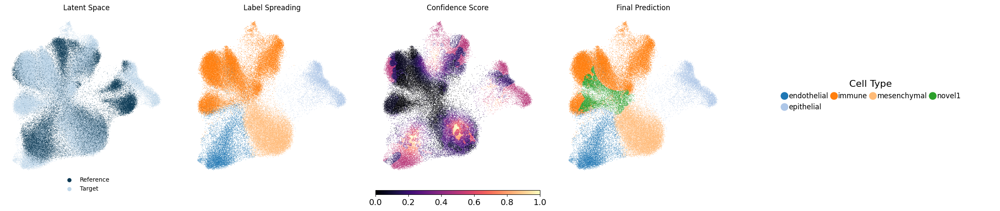

UMAP plot saved.
Generating spatial plot...


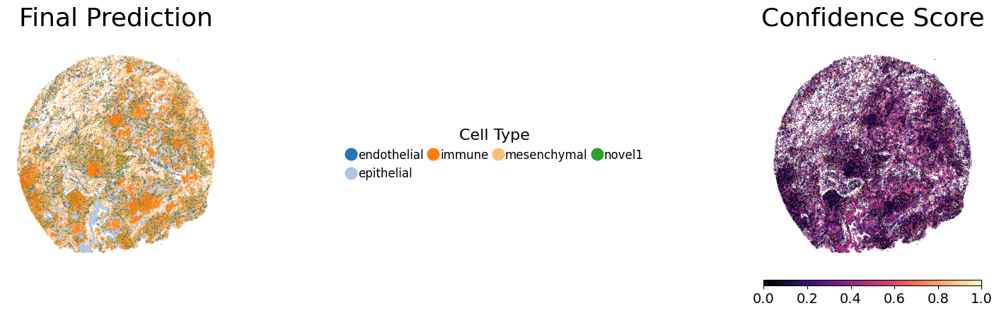

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 7...
Random seed set as 8
Generating UMAP plot...


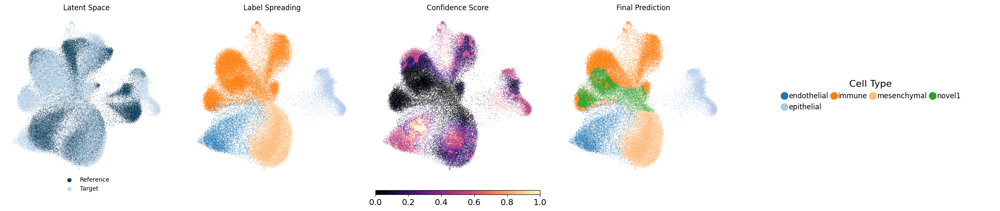

UMAP plot saved.
Generating spatial plot...


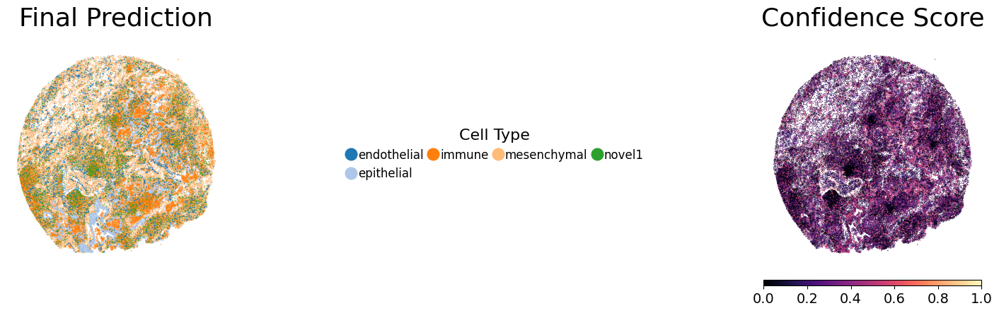

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 8...
Random seed set as 9
Generating UMAP plot...


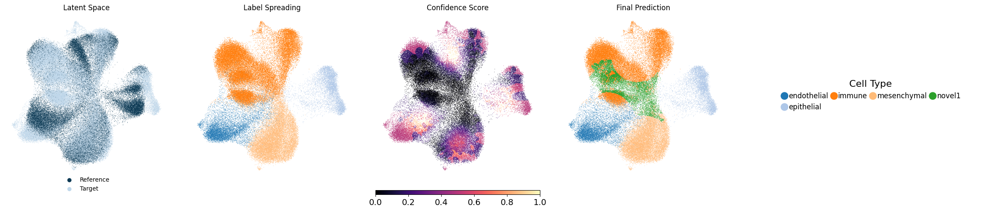

UMAP plot saved.
Generating spatial plot...


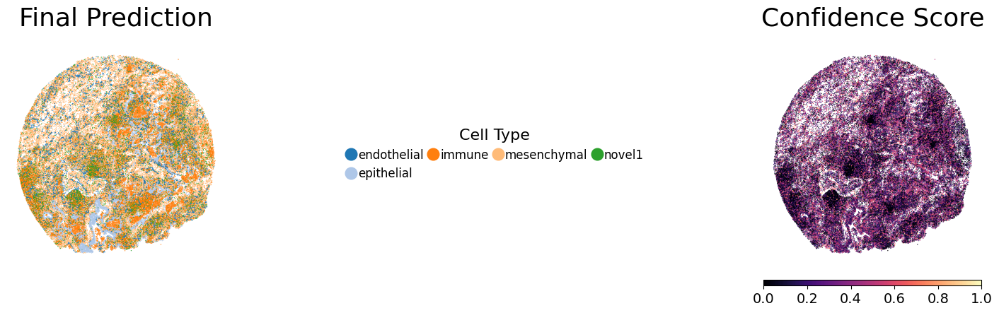

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 9...
Random seed set as 10
Generating UMAP plot...


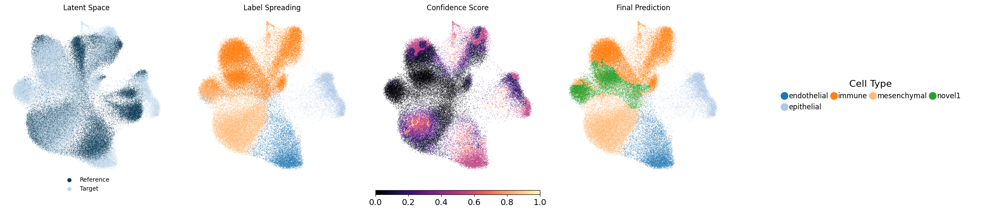

UMAP plot saved.
Generating spatial plot...


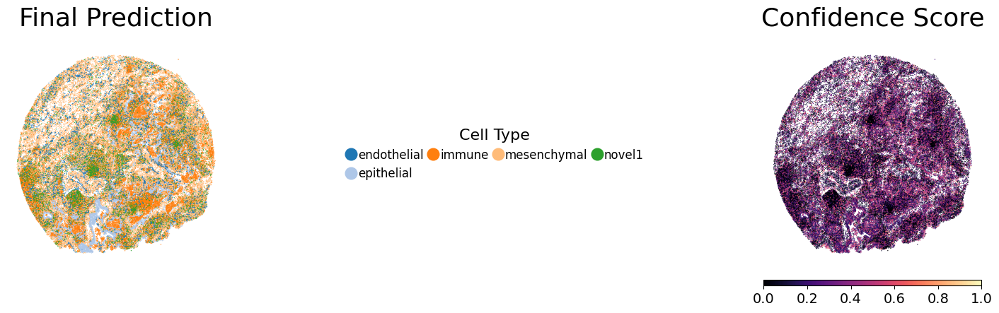

Spatial plot saved.

──────────────────────────────────────────
Starting plotting for seed 10...
Random seed set as 11
Generating UMAP plot...


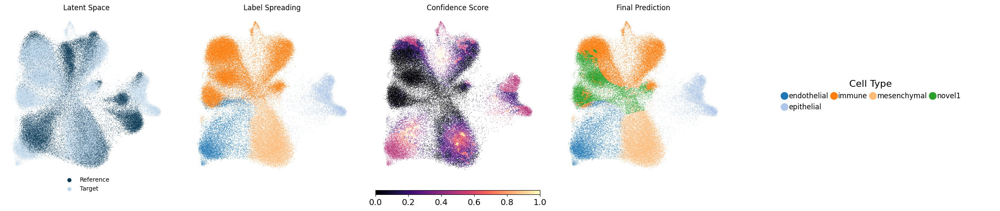

UMAP plot saved.
Generating spatial plot...


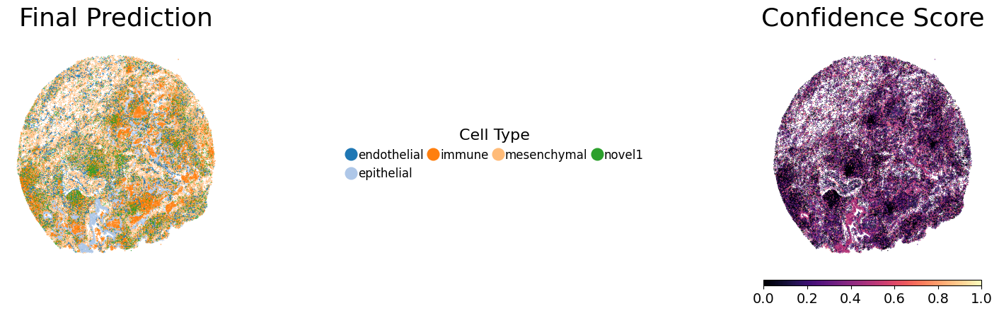

Spatial plot saved.

──────────────────────────────────────────
All seeds plotted successfully.



In [ ]:
NovAST_plot(args)